# Week 7 Assignment

## Samantha Guerrero & Jessica Melendez

For this assignment we finally dive into our arrest data. We want to get a closer look into the types of arrests that were made during the summer of 2021 and we take a look at arrests that were made in the West LA and South LA areas.

First thing's first, let's import our libraries...

In [1]:
# for data wrangling
import pandas as pd

# for interactive plots
import plotly.express as px

# to import open data
from sodapy import Socrata

In [2]:
# connect to the data portal
client = Socrata("data.lacity.org", None)

# First 2000 results, returned as JSON from API / converted to Python list of
# dictionaries by sodapy.
results = client.get("amvf-fr72", limit=2000)

# Convert to pandas DataFrame
arrest = pd.DataFrame.from_records(results)

# print it with .sample, which gives you random rows
arrest.sample(2)

,rpt_id,report_type,arst_date,time,area,area_desc,rd,age,sex_cd,descent_cd,...,location_1,:@computed_region_k96s_3jcv,:@computed_region_tatf_ua23,bkg_date,bkg_time,bgk_location,:@computed_region_kqwf_mjcx,:@computed_region_2dna_qi2s,bkg_loc_cd,:@computed_region_ur2y_g4cx
608,6221603,BOOKING,2021-07-27T00:00:00.000,2000,05,Harbor,0532,22,M,H,...,"{'type': 'Point', 'coordinates': [-118.2717, 3...",959,641,2021-07-27T00:00:00.000,2158,HARBOR,15,15,4205,NaN
667,6222836,BOOKING,2021-07-29T00:00:00.000,2030,12,77th Street,1283,55,F,B,...,"{'type': 'Point', 'coordinates': [-118.309, 33...",779,1168,2021-07-29T00:00:00.000,2221,77TH ST,14,20,4212,7


Okay, perfect! Now let's get more familiar with our data set.

In [3]:
arrest.shape

(2000, 31)

In [4]:
arrest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 31 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   rpt_id                       2000 non-null   object
 1   report_type                  2000 non-null   object
 2   arst_date                    2000 non-null   object
 3   time                         2000 non-null   object
 4   area                         2000 non-null   object
 5   area_desc                    2000 non-null   object
 6   rd                           2000 non-null   object
 7   age                          2000 non-null   object
 8   sex_cd                       2000 non-null   object
 9   descent_cd                   2000 non-null   object
 10  chrg_grp_cd                  1849 non-null   object
 11  grp_description              1849 non-null   object
 12  arst_typ_cd                  2000 non-null   object
 13  charge                       2000

In [5]:
arrest.head()

,rpt_id,report_type,arst_date,time,area,area_desc,rd,age,sex_cd,descent_cd,...,location_1,:@computed_region_k96s_3jcv,:@computed_region_tatf_ua23,bkg_date,bkg_time,bgk_location,:@computed_region_kqwf_mjcx,:@computed_region_2dna_qi2s,bkg_loc_cd,:@computed_region_ur2y_g4cx
0,6115382,BOOKING,2021-01-29T00:00:00.000,2035,01,Central,0176,36,M,H,...,"{'type': 'Point', 'coordinates': [-118.2485, 3...",537,527,2021-01-29T00:00:00.000,2155,METRO - JAIL DIVISION,9,76,4273,NaN
1,211218835,RFC,2021-09-01T00:00:00.000,1230,12,77th Street,1207,22,M,H,...,"{'type': 'Point', 'coordinates': [-118.2915, 3...",738,896,NaN,NaN,NaN,13,2,NaN,7
2,211611663,RFC,2021-09-20T00:00:00.000,1735,16,Foothill,1675,24,M,H,...,"{'type': 'Point', 'coordinates': [0, 0]}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,211911576,RFC,2021-07-27T00:00:00.000,0850,19,Mission,1961,51,F,H,...,"{'type': 'Point', 'coordinates': [-118.4677, 3...",116,1092,NaN,NaN,NaN,1,73,NaN,NaN
4,211413626,RFC,2021-06-16T00:00:00.000,1615,14,Pacific,1411,30,M,W,...,"{'type': 'Point', 'coordinates': [-118.4791, 3...",908,970,NaN,NaN,NaN,10,30,NaN,10


For starters, let's take a look into arrest data from the beginning of this summer-- Between June 2021 and August 2021

In [6]:
results = client.get("amvf-fr72", 
                     limit = 10000, 
                     where = "arst_date between '2021-06-01T00:00:00' and '2021-08-01T00:00:00'"
                    )

Convert this into a dataframe...

In [7]:
arrest = pd.DataFrame.from_records(results)

What does this new dataframe look like?

In [8]:
arrest.shape

(10000, 25)

In [9]:
arrest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 25 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   rpt_id           10000 non-null  object
 1   report_type      10000 non-null  object
 2   arst_date        10000 non-null  object
 3   time             9999 non-null   object
 4   area             10000 non-null  object
 5   area_desc        10000 non-null  object
 6   rd               10000 non-null  object
 7   age              10000 non-null  object
 8   sex_cd           10000 non-null  object
 9   descent_cd       10000 non-null  object
 10  chrg_grp_cd      9374 non-null   object
 11  grp_description  9373 non-null   object
 12  arst_typ_cd      10000 non-null  object
 13  charge           10000 non-null  object
 14  chrg_desc        9374 non-null   object
 15  dispo_desc       9250 non-null   object
 16  location         10000 non-null  object
 17  lat              10000 non-null 

Sample the first 5 rows...

In [10]:
arrest.head()

,rpt_id,report_type,arst_date,time,area,area_desc,rd,age,sex_cd,descent_cd,...,dispo_desc,location,lat,lon,location_1,bkg_date,bkg_time,bgk_location,bkg_loc_cd,crsst
0,6190030,BOOKING,2021-06-01T00:00:00.000,1130,03,Southwest,0375,20,M,B,...,CITY ATTORNEY REJECT,2000 W MARTIN LUTHER KI BL,34.0146,-118.313,"{'type': 'Point', 'coordinates': [-118.313, 34...",2021-06-01T00:00:00.000,1410,77TH ST,4212,NaN
1,211510358,RFC,2021-06-01T00:00:00.000,0900,15,N Hollywood,1513,19,M,H,...,MISDEMEANOR COMPLAINT FILED,WHITSETT,34.1985,-118.4053,"{'type': 'Point', 'coordinates': [-118.4053, 3...",NaN,NaN,NaN,NaN,VOSE
2,6189982,BOOKING,2021-06-01T00:00:00.000,1225,09,Van Nuys,0935,35,M,H,...,NaN,14400 ERWIN ST,34.1837,-118.4422,"{'type': 'Point', 'coordinates': [-118.4422, 3...",2021-06-01T00:00:00.000,1232,VALLEY - JAIL DIV,4279,NaN
3,6189891,BOOKING,2021-06-01T00:00:00.000,0715,10,West Valley,1035,33,M,H,...,MISDEMEANOR COMPLAINT FILED,6700 LINDLEY AV,34.1921,-118.5273,"{'type': 'Point', 'coordinates': [-118.5273, 3...",2021-06-01T00:00:00.000,0846,VALLEY - JAIL DIV,4279,NaN
4,6190217,BOOKING,2021-06-01T00:00:00.000,1900,18,Southeast,1864,24,M,B,...,MISDEMEANOR COMPLAINT FILED,800 E 116TH ST,33.9292,-118.2604,"{'type': 'Point', 'coordinates': [-118.2604, 3...",2021-06-01T00:00:00.000,2117,77TH ST,4212,NaN


Last 5 rows...

In [11]:
arrest.tail()

,rpt_id,report_type,arst_date,time,area,area_desc,rd,age,sex_cd,descent_cd,...,dispo_desc,location,lat,lon,location_1,bkg_date,bkg_time,bgk_location,bkg_loc_cd,crsst
9995,6219789,BOOKING,2021-07-23T00:00:00.000,2305,10,West Valley,1044,30,M,H,...,MISDEMEANOR COMPLAINT FILED,18400 COLLINS ST,34.1749,-118.5323,"{'type': 'Point', 'coordinates': [-118.5323, 3...",2021-07-24T00:00:00.000,0542,VALLEY - JAIL DIV,4279,NaN
9996,6219610,BOOKING,2021-07-23T00:00:00.000,2148,14,Pacific,1443,63,M,W,...,MISDEMEANOR COMPLAINT FILED,VENICE,33.9975,-118.4456,"{'type': 'Point', 'coordinates': [-118.4456, 3...",2021-07-23T00:00:00.000,2302,PACIFIC,4214,WALGROVE
9997,6219738,BOOKING,2021-07-23T00:00:00.000,2330,20,Olympic,2049,36,M,O,...,MISDEMEANOR COMPLAINT FILED,2700 W 8TH ST,34.0577,-118.2842,"{'type': 'Point', 'coordinates': [-118.2842, 3...",2021-07-24T00:00:00.000,0322,METRO - JAIL DIVISION,4273,NaN
9998,6219344,BOOKING,2021-07-23T00:00:00.000,1000,09,Van Nuys,0935,22,M,O,...,NaN,14400 ERWIN ST,34.1837,-118.4422,"{'type': 'Point', 'coordinates': [-118.4422, 3...",2021-07-23T00:00:00.000,1059,VALLEY - JAIL DIV,4279,NaN
9999,6219646,BOOKING,2021-07-23T00:00:00.000,2010,01,Central,0182,38,M,B,...,FELONY COMPLAINT FILED,9TH,34.0444,-118.2593,"{'type': 'Point', 'coordinates': [-118.2593, 3...",2021-07-24T00:00:00.000,0014,77TH ST,4212,GRAND


Let's start charting this data!

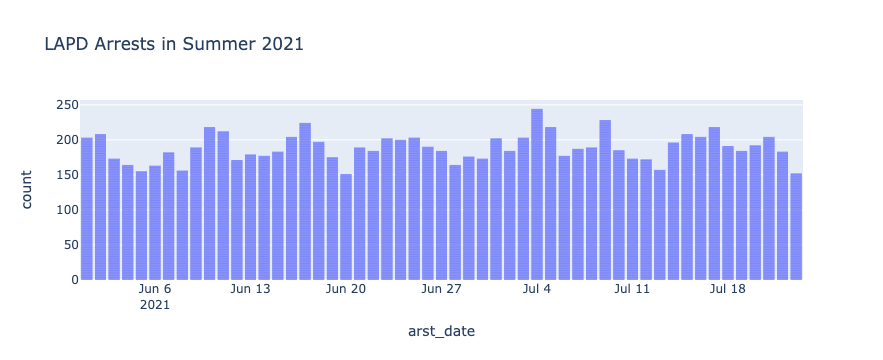

In [12]:
# a simple bar chart, putting date on the x-axis
fig = px.bar(arrest,
       x='arst_date',
       title='LAPD Arrests in Summer 2021'
      )

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

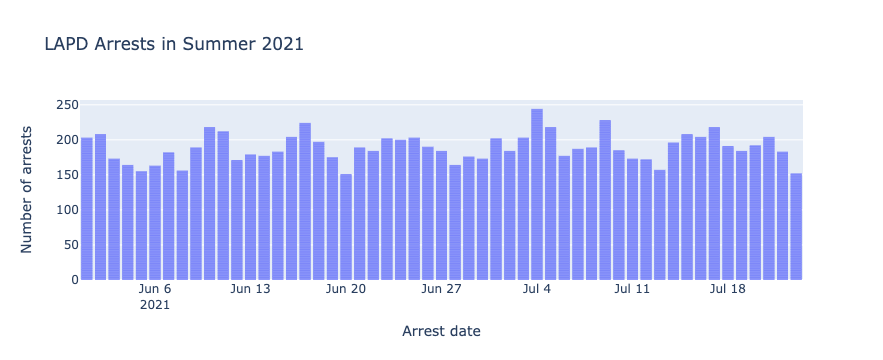

In [13]:

fig = px.bar(
        arrest,
        x='arst_date',
        title='LAPD Arrests in Summer 2021',
        labels={
            'arst_date':'Arrest date',
            'count':'Number of arrests'
        }
)

fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

Peaks:
* June 1,Weekend
* June 2, Weekend
* June 10, Thursday
* June 11, Friday 
* June 17, Thursday 
* July 4, Holiday
* July 9, Friday 
* July 17 Saturday 
* July 21 Wednesday

Let's take a look into the types of arrests being made...

In [14]:
arrest.grp_description.unique().tolist()

['Robbery',
 nan,
 'Other Assaults',
 'Sex (except rape/prst)',
 'Weapon (carry/poss)',
 'Aggravated Assault',
 'Vehicle Theft',
 'Miscellaneous Other Violations',
 'Narcotic Drug Laws',
 'Driving Under Influence',
 'Moving Traffic Violations',
 'Burglary',
 'Receive Stolen Property',
 'Larceny',
 'Prostitution/Allied',
 'Gambling',
 'Liquor Laws',
 'Non-Criminal Detention',
 'Fraud/Embezzlement',
 'Homicide',
 'Drunkeness',
 'Against Family/Child',
 'Forgery/Counterfeit',
 'Rape',
 'Disorderly Conduct',
 'Disturbing the Peace',
 'Federal Offenses']

Let's look at how many arrests were made by arrest description

In [15]:
arrest_by_charge = arrest.grp_description.value_counts().reset_index()
arrest_by_charge

,index,grp_description
0,Aggravated Assault,1444
1,Miscellaneous Other Violations,1360
2,Other Assaults,995
3,Driving Under Influence,968
4,Weapon (carry/poss),860
5,Narcotic Drug Laws,734
6,Vehicle Theft,497
7,Prostitution/Allied,321
8,Robbery,317
9,Moving Traffic Violations,289


Let's change the name of our columns to make it easier to understand when we chart them

In [16]:
arrest_by_charge.columns=['charge','count']
arrest_by_charge

,charge,count
0,Aggravated Assault,1444
1,Miscellaneous Other Violations,1360
2,Other Assaults,995
3,Driving Under Influence,968
4,Weapon (carry/poss),860
5,Narcotic Drug Laws,734
6,Vehicle Theft,497
7,Prostitution/Allied,321
8,Robbery,317
9,Moving Traffic Violations,289


Let's plot the top 20 charges

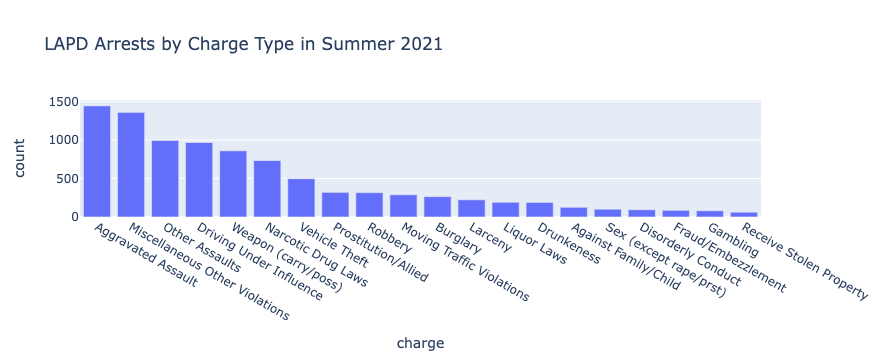

In [17]:
fig = px.bar(arrest_by_charge.head(20),
       x='charge',
       y='count',
       title='LAPD Arrests by Charge Type in Summer 2021')

fig.show()

Now, let's look at the amount of arrests that were made by day and by arrest types to get a better understanding of what types of arrest are being made on a daily basis during the summer. Let's do this by using a groupby function.

In [18]:
arrest_grouped=arrest.groupby(['arst_date','grp_description']).count()[['rpt_id']]
arrest_grouped.head(50)

rpt_id
arst_date               grp_description                       
2021-06-01T00:00:00.000 Aggravated Assault                  31
                        Burglary                             6
                        Driving Under Influence             17
                        Fraud/Embezzlement                   2
                        Gambling                            11
                        Homicide                             1
                        Larceny                              4
                        Liquor Laws                          2
                        Miscellaneous Other Violations      24
                        Moving Traffic Violations            3
                        Narcotic Drug Laws                  13
                        Non-Criminal Detention               1
                        Other Assaults                      24
                        Prostitution/Allied                  2
                        Receive Stolen Property              2
                        Robbery                             12
                        Sex (except rape/prst)               5
                        Vehicle Theft                        9
                        Weapon (carry/poss)                 22
2021-06-02T00:00:00.000 Against Family/Child                 1
                        Aggravated Assault                  19
                        Burglary                             5
                        Driving Under Influence             12
                        Drunkeness                           5
                        Forgery/Counterfeit                  1
                        Fraud/Embezzlement                   4
                        Gambling                            11
                        Homicide                             1
                        Larceny                              5
                        Liquor Laws                          1
                        Miscellaneous Other Violations      32
                        Moving Traffic Violations            5
                        Narcotic Drug Laws                  24
                        Non-Criminal Detention               1
                        Other Assaults                      19
                        Prostitution/Allied                 26
                        Robbery                              2
                        Sex (except rape/prst)               3
                        Vehicle Theft                        7
                        Weapon (carry/poss)                 11
2021-06-03T00:00:00.000 Against Family/Child                 1
                        Aggravated Assault                  23
                        Burglary                             8
                        Driving Under Influence             11
                        Drunkeness                           1
                        Forgery/Counterfeit                  1
                        Fraud/Embezzlement                   2
                        Homicide                             1
                        Larceny                              2
                        Liquor Laws                          3

Before we can chart this, we have to flatten the multi-level, multi-index dataframe 

In [19]:
arrest_flat = arrest_grouped.reset_index()
arrest_flat

,arst_date,grp_description,rpt_id
0,2021-06-01T00:00:00.000,Aggravated Assault,31
1,2021-06-01T00:00:00.000,Burglary,6
2,2021-06-01T00:00:00.000,Driving Under Influence,17
3,2021-06-01T00:00:00.000,Fraud/Embezzlement,2
4,2021-06-01T00:00:00.000,Gambling,11
...,...,...,...
1026,2021-07-23T00:00:00.000,Receive Stolen Property,1
1027,2021-07-23T00:00:00.000,Robbery,7
1028,2021-07-23T00:00:00.000,Sex (except rape/prst),3
1029,2021-07-23T00:00:00.000,Vehicle Theft,6


Again, let's change the name of our columns to better understand when we chart them...

In [20]:
arrest_flat = arrest_flat.rename(columns={'rpt_id':'count'})
arrest_flat

,arst_date,grp_description,count
0,2021-06-01T00:00:00.000,Aggravated Assault,31
1,2021-06-01T00:00:00.000,Burglary,6
2,2021-06-01T00:00:00.000,Driving Under Influence,17
3,2021-06-01T00:00:00.000,Fraud/Embezzlement,2
4,2021-06-01T00:00:00.000,Gambling,11
...,...,...,...
1026,2021-07-23T00:00:00.000,Receive Stolen Property,1
1027,2021-07-23T00:00:00.000,Robbery,7
1028,2021-07-23T00:00:00.000,Sex (except rape/prst),3
1029,2021-07-23T00:00:00.000,Vehicle Theft,6


Let's chart this!

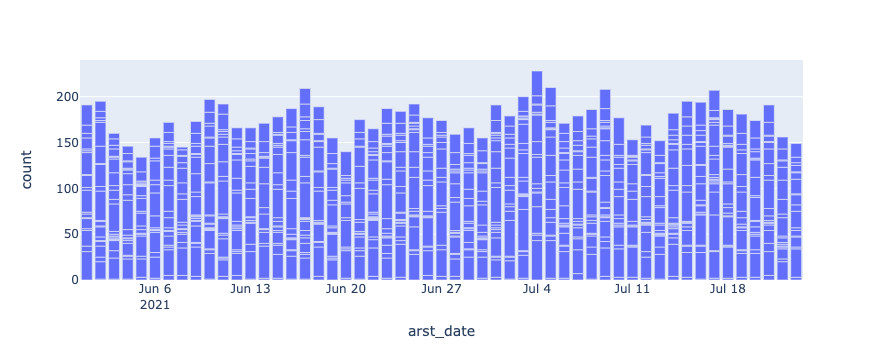

In [21]:
fig = px.bar(arrest_flat,
       x='arst_date',
       y='count'
)

fig.show()

okay, so let's clean this up a bit now and stach our bar chart...

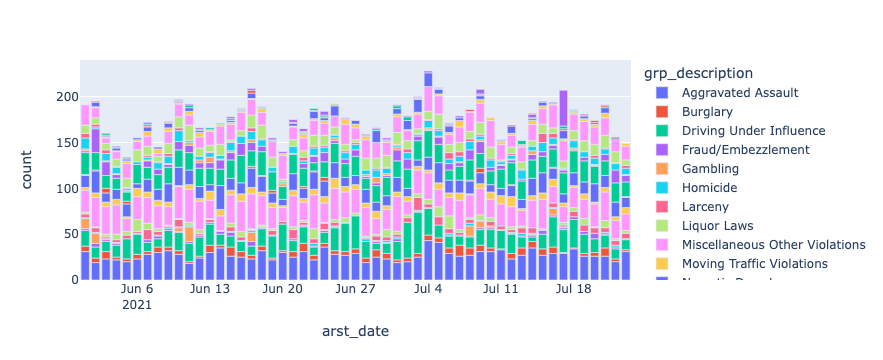

In [22]:
fig = px.bar(arrest_flat,
       x='arst_date',
       y='count',
       color='grp_description' 
)

fig.show()

interesting... looks like majority of arrests that were made on a daily basis were for aggravated assault, driving under the influence, "miscellaneous" or "other" violations, narctoic drug laws, "other" assaults, and carrying or possessing a weapon. It would be interesting to knoe what "miscellaneous" or "other" violations mean since this category is among the highest but there is no clear description of what those arrests were made for. If LAPD is using a data-informed approach to their policing methods, how would they explain what these arrests were made for and how would this accurately show how they are making efforts to reduce these types of arrests. 

Note also: 41.18 was passed during the summer, do those "miscellaneous" violations include incarcerating houseless people?

Lots to uncover but let's look at our data again and see how to clean it up!

In [23]:
arrest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 25 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   rpt_id           10000 non-null  object
 1   report_type      10000 non-null  object
 2   arst_date        10000 non-null  object
 3   time             9999 non-null   object
 4   area             10000 non-null  object
 5   area_desc        10000 non-null  object
 6   rd               10000 non-null  object
 7   age              10000 non-null  object
 8   sex_cd           10000 non-null  object
 9   descent_cd       10000 non-null  object
 10  chrg_grp_cd      9374 non-null   object
 11  grp_description  9373 non-null   object
 12  arst_typ_cd      10000 non-null  object
 13  charge           10000 non-null  object
 14  chrg_desc        9374 non-null   object
 15  dispo_desc       9250 non-null   object
 16  location         10000 non-null  object
 17  lat              10000 non-null 

Since theres a lot of fields, let's take out the fields most interesting or useful for us to look at

In [24]:
arrest_mini = arrest[['arst_date','area_desc','descent_cd','grp_description','lat','lon']]

In [25]:
arrest_mini.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   arst_date        10000 non-null  object
 1   area_desc        10000 non-null  object
 2   descent_cd       10000 non-null  object
 3   grp_description  9373 non-null   object
 4   lat              10000 non-null  object
 5   lon              10000 non-null  object
dtypes: object(6)
memory usage: 468.9+ KB


Looks like we need to convert our lats and longs into floats...

In [27]:
arrest_mini['lat'] = arrest_mini['lat'].astype(float)
arrest_mini['lon'] = arrest_mini['lon'].astype(float)
arrest_mini.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   arst_date        10000 non-null  object 
 1   area_desc        10000 non-null  object 
 2   descent_cd       10000 non-null  object 
 3   grp_description  9373 non-null   object 
 4   lat              10000 non-null  float64
 5   lon              10000 non-null  float64
dtypes: float64(2), object(4)
memory usage: 468.9+ KB


/tmp/ipykernel_244/1256201848.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_244/1256201848.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



What if we do a scatter plot with this data?

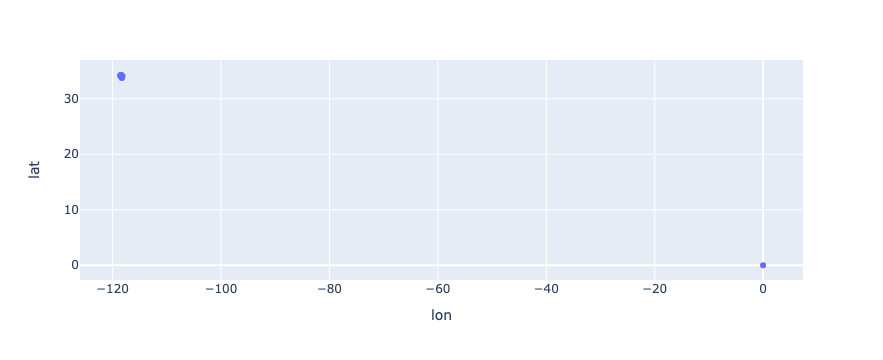

In [28]:
fig = px.scatter(arrest_mini,
           x='lon',
           y='lat'
)

fig.show()

Seems like we have an outlier... what is it?

In [30]:
arrest_mini[arrest_mini.lon == 0]

,arst_date,area_desc,descent_cd,grp_description,lat,lon
178,2021-06-01T00:00:00.000,Pacific,W,Miscellaneous Other Violations,0.0,0.0
179,2021-06-01T00:00:00.000,Pacific,B,Miscellaneous Other Violations,0.0,0.0
180,2021-06-01T00:00:00.000,Rampart,H,Gambling,0.0,0.0
181,2021-06-01T00:00:00.000,Rampart,W,Narcotic Drug Laws,0.0,0.0
182,2021-06-01T00:00:00.000,Rampart,K,Narcotic Drug Laws,0.0,0.0
...,...,...,...,...,...,...
9928,2021-07-23T00:00:00.000,Van Nuys,H,Prostitution/Allied,0.0,0.0
9941,2021-07-23T00:00:00.000,Van Nuys,B,Prostitution/Allied,0.0,0.0
9943,2021-07-23T00:00:00.000,Foothill,O,Other Assaults,0.0,0.0
9964,2021-07-23T00:00:00.000,Rampart,H,Narcotic Drug Laws,0.0,0.0


Let's drop the outliers and keep the other rows using a not equal notation (!=)

In [31]:
arrest_mini = arrest_mini[arrest_mini.lon != 0]

Let's plot this again...

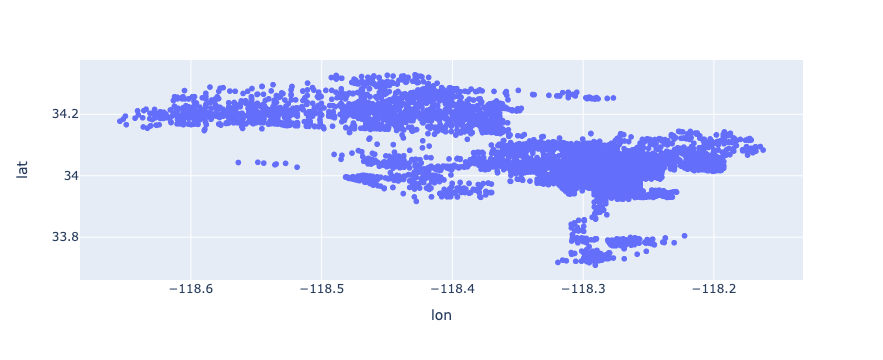

In [32]:
fig = px.scatter(arrest_mini,
           x='lon',
           y='lat'
)

fig.show()

Let's use plotly maps to make this more interactive

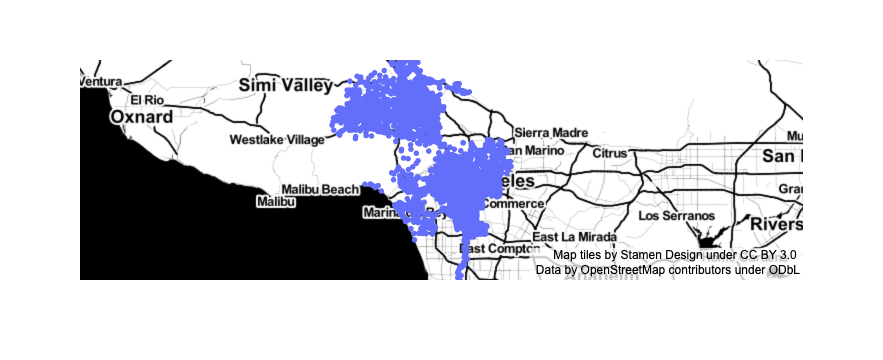

In [33]:
fig = px.scatter_mapbox(arrest_mini,
                        lat='lat',
                        lon='lon',
                        mapbox_style="stamen-toner")
fig.show()

does most crime happen near the 110 freeway? interesting

Let's try plotting this according to race

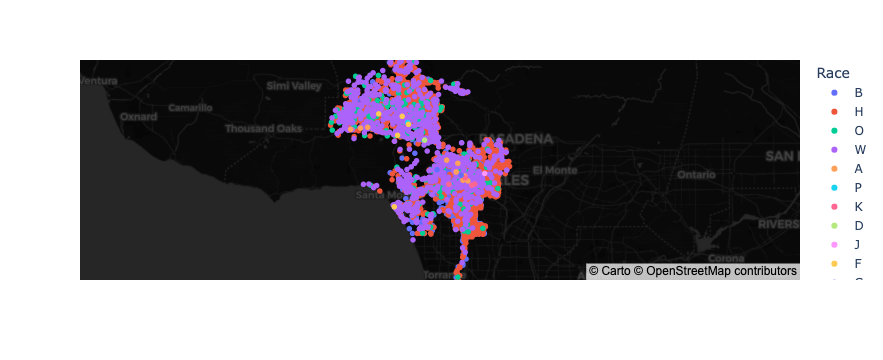

In [35]:
fig = px.scatter_mapbox(arrest_mini, 
                        lat="lat", 
                        lon="lon", 
                        color="descent_cd",
                        labels={'descent_cd':'Race'}
                       )

fig.update_layout(mapbox_style="carto-darkmatter")

fig.show()

Lot's of Black and Hispanic arrests just based on this scatterplot... what would this look like if we label it by area_desc

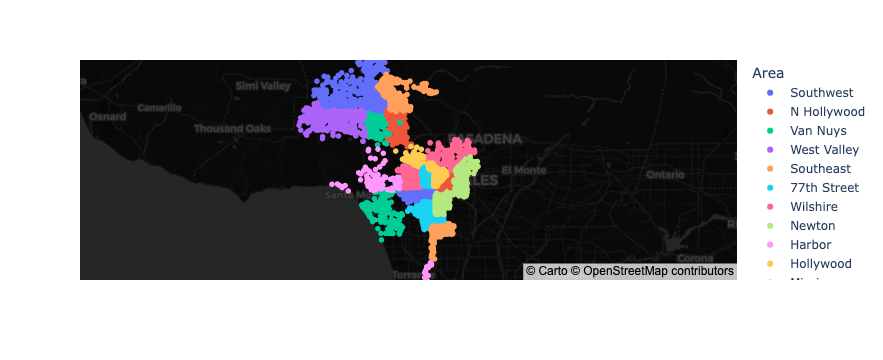

In [36]:
fig = px.scatter_mapbox(arrest_mini, 
                        lat="lat", 
                        lon="lon", 
                        color="area_desc",
                        labels={'area_desc':'Area'}
                       )

fig.update_layout(mapbox_style="carto-darkmatter")

fig.show()

Looking at this scatter plot... West LA is highlighted in the light pink on the western part of this map. South LA is represented by the 77th Street division (the orange on the map), Newton Police Station(in the magenta) just to the east of 77th, and South West (in the purple) just west of 77th. South LA divisions are located centrally in this map. The 110 and 10 freeway border the South LA police stations as well. 

Now, let's look at how we can create a function...

In [37]:
def race_map(race='H'):
    
    fig = px.scatter_mapbox(
                            arrest_mini[arrest_mini.descent_cd==race], 
                            lat="lat", 
                            lon="lon", 
                            color="descent_cd",
                            labels={'descent_cd':'Race'}
                           )

    fig.update_layout(mapbox_style="carto-darkmatter")

    fig.show()

What if we call it to plot Hispanic arrests...

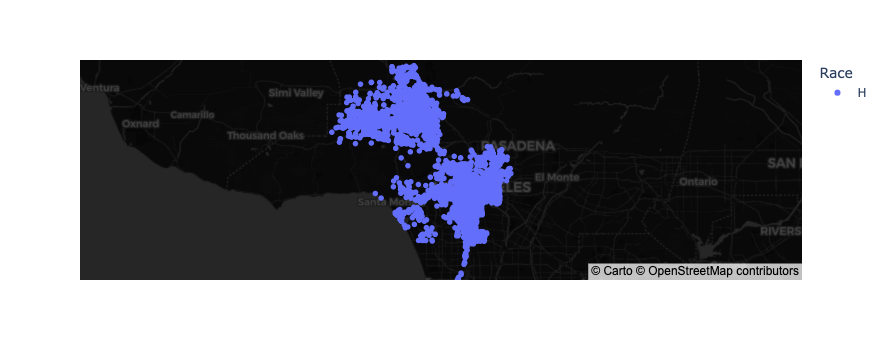

In [38]:
race_map(race='H')

okay, now let's look into calling it to plot Black arrests...will there be any similarities?

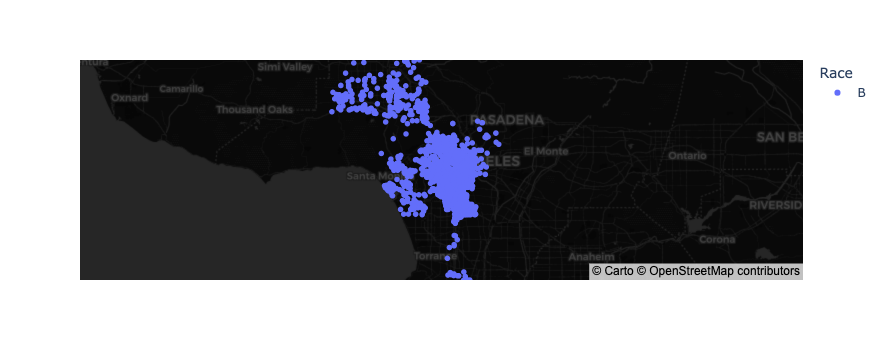

In [39]:
race_map(race='B')

interesting, both of these have very similar visualizations. However, it seems like there are more Hispanic arrests made in the Burbank and San Fernando area than there are Black arrests. The demographics in this area might account for why there are more Hispanic arrests than Black arrest, but it still does not give us a full picture. 

Now, let's create a loop and map...

In [40]:
area_list = arrest_mini.area_desc.unique().tolist()
area_list

['Southwest',
 'N Hollywood',
 'Van Nuys',
 'West Valley',
 'Southeast',
 '77th Street',
 'Wilshire',
 'Newton',
 'Harbor',
 'Hollywood',
 'Mission',
 'Central',
 'Pacific',
 'Topanga',
 'Foothill',
 'Olympic',
 'Northeast',
 'Hollenbeck',
 'West LA',
 'Rampart',
 'Devonshire']

In [41]:
def area_map(area='77th Street'):
    
    fig = px.scatter_mapbox(
                            arrest_mini[arrest_mini.area_desc==area], 
                            lat="lat", 
                            lon="lon", 
                            color="area_desc",
                            labels={'area_desc':'Area'}
                           )

    fig.update_layout(mapbox_style="carto-darkmatter")

    fig.show()

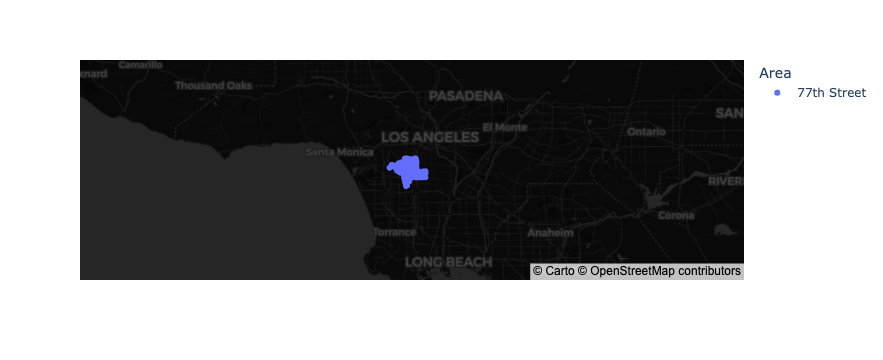

In [42]:
area_map(area='77th Street')

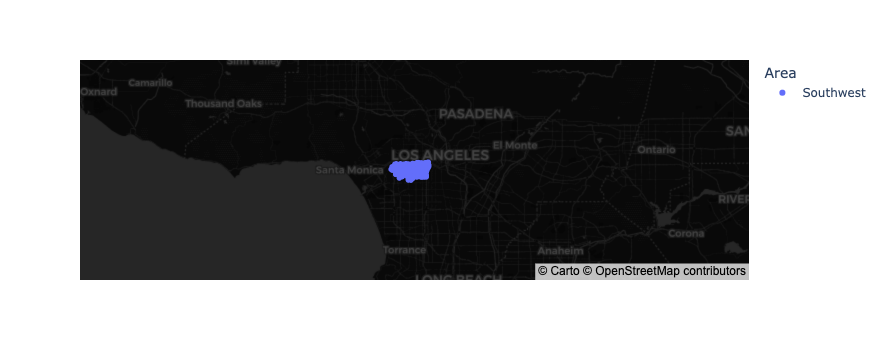

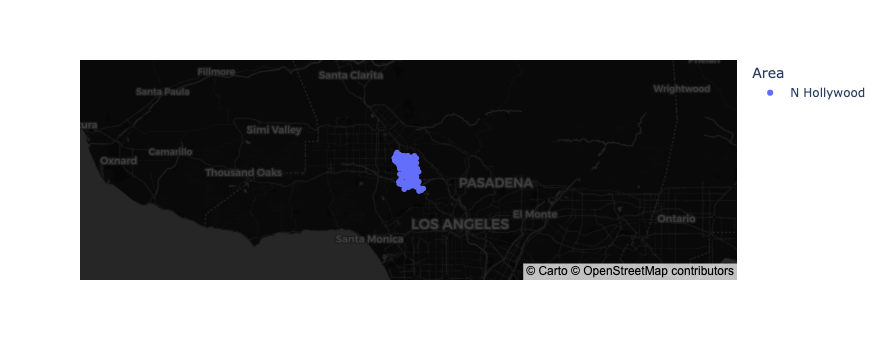

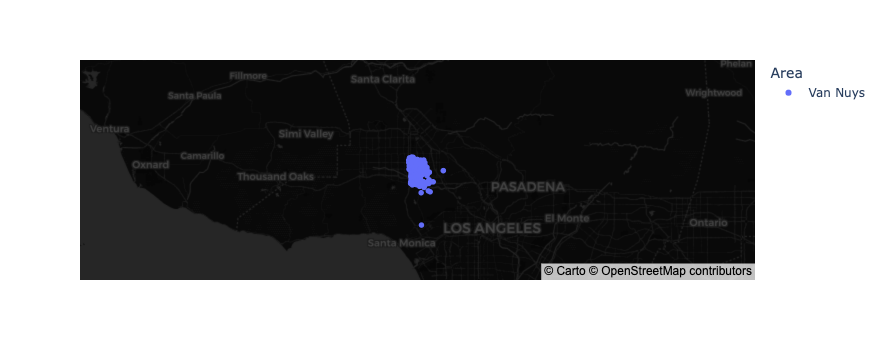

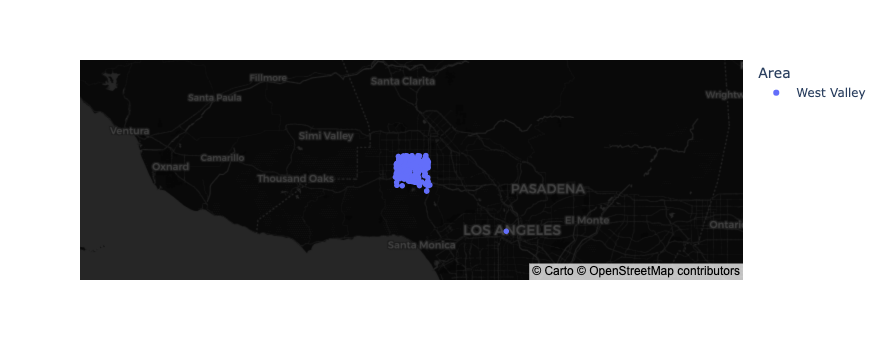

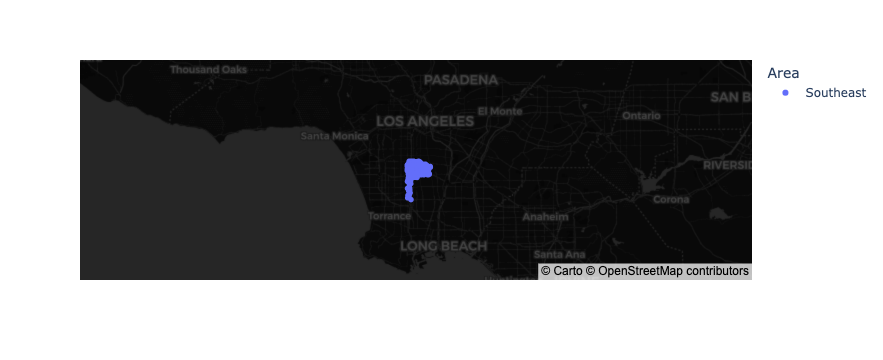

...

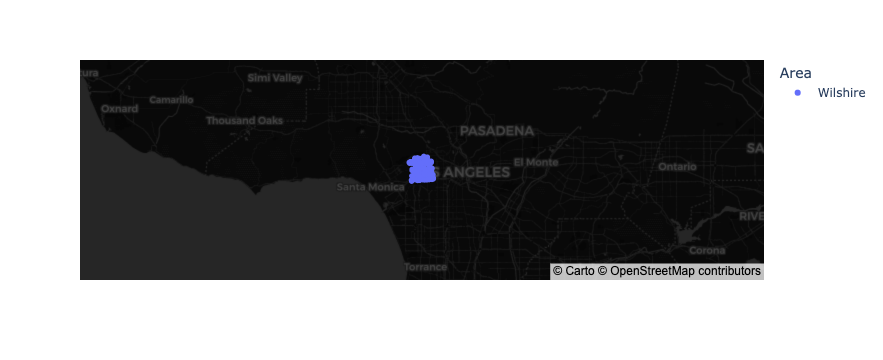

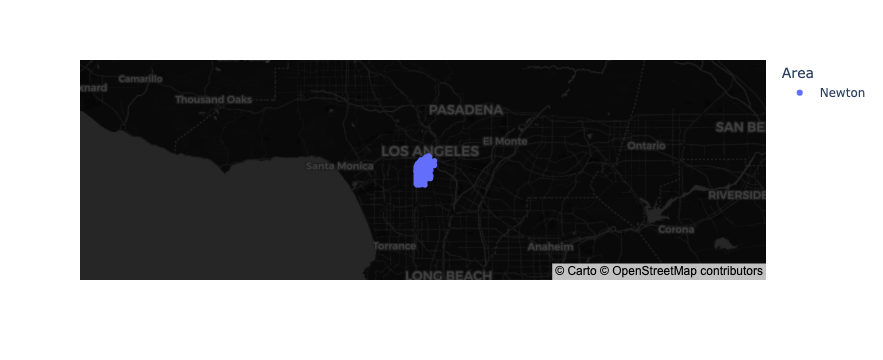

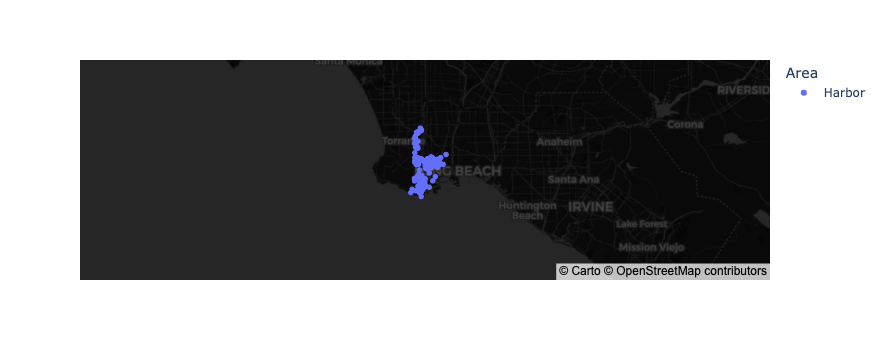

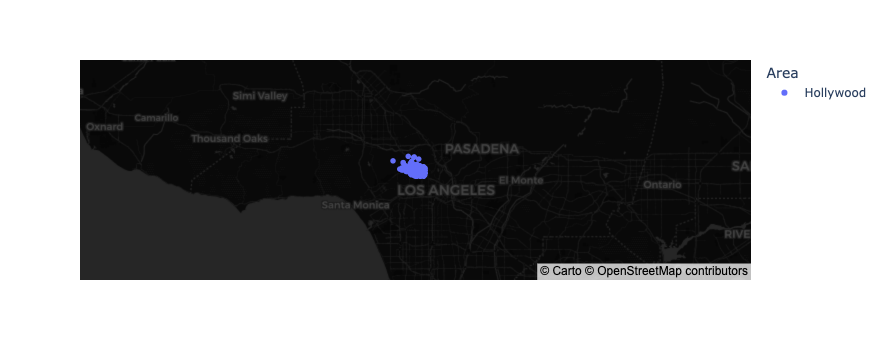

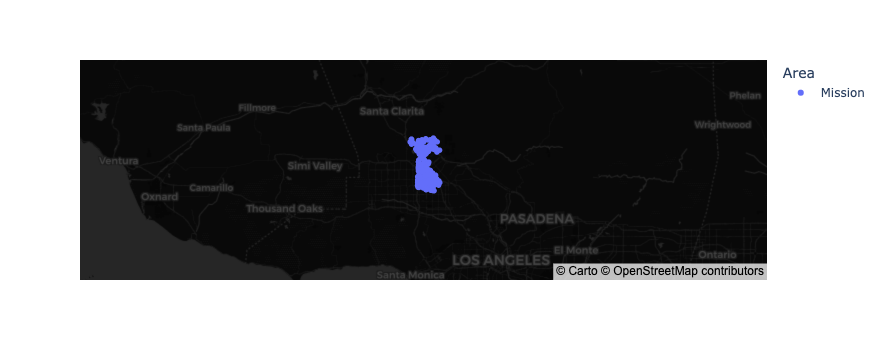

In [43]:
for area in area_list:
    area_map(area)